In [116]:
import nltk
from nltk import word_tokenize
nltk.download('book')
from nltk.util import ngrams
from nltk.book import * 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

[nltk_data] Downloading collection 'book'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     /Users/cristianmurillo/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package brown to
[nltk_data]    |     /Users/cristianmurillo/nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package chat80 to
[nltk_data]    |     /Users/cristianmurillo/nltk_data...
[nltk_data]    |   Package chat80 is already up-to-date!
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /Users/cristianmurillo/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package conll2000 to
[nltk_data]    |     /Users/cristianmurillo/nltk_data...
[nltk_data]    |   Package conll2000 is already up-to-date!
[nltk_data]    | Downloading package conll2002 to
[nltk_data]    |     /Users/cristianmurillo/nltk_data...
[nltk_data]    |   Package c

**BI-GRAMS**

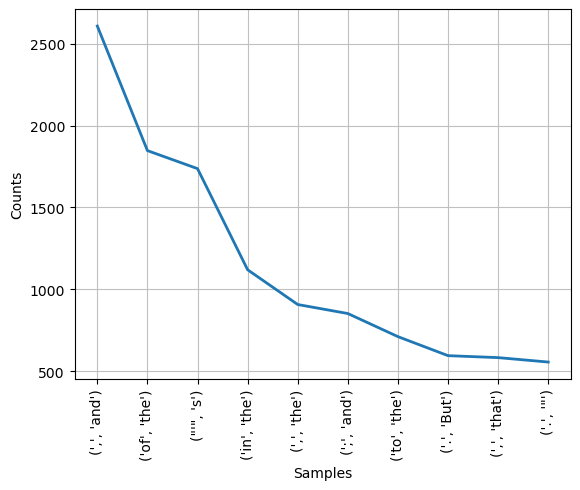

<Axes: xlabel='Samples', ylabel='Counts'>

In [128]:
# Im extracting bigrams from the text
bigrams = list(nltk.bigrams(text1))
# Im extracting frequency distribution of bigrams in the text
fdist = nltk.FreqDist(bigrams)
fdist
fdist.most_common(5)
fdist.plot(10)

In [118]:
# im filtering bigrams with words that have more than (threshold) characters
threshold = 2
filtered_bigrams = [bigram for bigram in bigrams if len(bigram[0])>threshold and len(bigram[1])>threshold]
filtered_fdist_bigrams = nltk.FreqDist(filtered_bigrams)
filtered_fdist_bigrams.most_common(10)
#filtered_fdist.plot(20)

[(('from', 'the'), 428),
 (('the', 'whale'), 369),
 (('and', 'the'), 357),
 (('with', 'the'), 308),
 (('for', 'the'), 285),
 (('into', 'the'), 246),
 (('the', 'ship'), 235),
 (('the', 'sea'), 223),
 (('upon', 'the'), 216),
 (('that', 'the'), 215)]

**N-GRAMS**

In [119]:
# calculate trigrams from the text
trigrams = list(nltk.ngrams(text1,3))

# calculate frequency distribution of trigrams in the text
fdist = nltk.FreqDist(trigrams)

# plot the top 10 trigrams by frequency
#fdist.plot(10)


In [120]:
# filter trigrams with words that have more than (threshold) characters
threshold = 2
filtered_trigrams = [trigram for trigram in trigrams if len(trigram[0])>threshold and len(trigram[1])>threshold and len(trigram[2])>threshold]
filtered_fdist_trigrams = nltk.FreqDist(filtered_trigrams)
#filtered_fdist_trigrams.most_common(20)
#filtered_fdist_trigrams.plot(20)

**COLOCACIONES**

Collocations are combinations of words or terms that tend to appear together with a significantly higher frequency than would be expected by chance. In other words, they are established linguistic associations in a language that reflect common and typical word combinations in a given context.

Collocations are not simply random word sequences, but they have specific meaning and associations that are recognized and used by native speakers of a language. These word combinations often have a meaning that is not just the sum of the individual parts, making them distinct and worth studying.


In [121]:
df = pd.DataFrame()
df['bi_grams'] = list(set(filtered_bigrams)) # set() to remove duplicates
df['first_word'] = df['bi_grams'].apply(lambda x: x[0]) # lambda function to extract first word
df['second_word'] = df['bi_grams'].apply(lambda x: x[1]) # lambda function to extract second word
df


,bi_grams,first_word,second_word
0,"(And, had)",And,had
1,"(see, this)",see,this
2,"(which, unheeded)",which,unheeded
3,"(the, pistols)",the,pistols
4,"(within, also)",within,also
...,...,...,...
67937,"(wonderful, patience)",wonderful,patience
67938,"(solar, fire)",solar,fire
67939,"(also, aware)",also,aware
67940,"(Presbyterian, form)",Presbyterian,form


**CALCULING PMI (Pointwise Mutual Information)**

The PMI is commonly used to identify collocations and determine how strong the relationship is between two specific words in a given context.

The PMI is calculated by comparing the co-occurrence frequency of two words with their individual occurrence frequencies.

El resultado del cálculo del PMI proporciona una puntuación que indica cuán fuerte es la asociación entre las dos palabras. Un valor positivo de PMI sugiere una asociación más fuerte de lo esperado, mientras que un valor negativo indica una asociación más débil de lo esperado. Cuanto mayor sea el valor absoluto del PMI, más fuerte será la asociación.

In [122]:
# PMI
# PMI is a measure of association used in information theory and statistics.
# PMI is used to measure the strength of association between two events.
# PMI is calculated as follows:
# PMI(x,y) = log(P(x,y)/(P(x)*P(y)))
# where P(x,y) is the probability of x and y occurring together.
# P(x) is the probability of x occurring.
# P(y) is the probability of y occurring.

filtered_words = [word for word in text1 if len(word)>threshold]
filtered_fdist_words = nltk.FreqDist(filtered_words) # frequency distribution of words in the text

df['bigram_frec'] = df['bi_grams'].apply(lambda x: filtered_fdist_bigrams[x]) # lambda function to extract bigram frequency
df['first_word_frec'] = df['first_word'].apply(lambda x: filtered_fdist_words[x]) # lambda function to extract first word frequency
df['second_word_frec'] = df['second_word'].apply(lambda x: filtered_fdist_words[x]) # lambda function to extract second word frequency
df['PMI'] = df.apply(lambda x: np.log((x['bigram_frec']/(x['first_word_frec']*x['second_word_frec']))), axis=1) # lambda function to calculate PMI
df.sort_values(by='PMI', ascending=False) # sort by PMI in descending order
df

,bi_grams,first_word,second_word,bigram_frec,first_word_frec,second_word_frec,PMI
0,"(And, had)",And,had,2,369,767,-11.860136
1,"(see, this)",see,this,5,253,1280,-11.078567
2,"(which, unheeded)",which,unheeded,1,640,3,-7.560080
3,"(the, pistols)",the,pistols,1,13721,2,-10.219830
4,"(within, also)",within,also,1,78,88,-8.834046
...,...,...,...,...,...,...,...
67937,"(wonderful, patience)",wonderful,patience,1,22,3,-4.189655
67938,"(solar, fire)",solar,fire,1,2,76,-5.023881
67939,"(also, aware)",also,aware,1,88,5,-6.086775
67940,"(Presbyterian, form)",Presbyterian,form,1,3,44,-4.882802


In [123]:
df['log_bigram_frec'] = df['bigram_frec'].apply(lambda x: np.log(x)) # lambda function to calculate log of bigram frequency

# making a plot of PMI vs log of bigram frequency
fig = px.scatter(df, x='PMI', y="log_bigram_frec", hover_data=['bi_grams'],color='PMI',hover_name='bi_grams')
fig.show()

# moby dick is the collocation most obvius.


**FILTERS AND COLLOCATIONS USING NLTK** 

In [124]:
from nltk.collocations import * 


In [126]:
import nltk
from nltk.collocations import *

bigram_messure = nltk.collocations.BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(text1)


In [127]:
finder.apply_freq_filter(20)
finder.nbest(bigram_messure.pmi,10)

[('Moby', 'Dick'),
 ('Sperm', 'Whale'),
 ('White', 'Whale'),
 ('Right', 'Whale'),
 ('Captain', 'Peleg'),
 (',"', 'said'),
 ('never', 'mind'),
 ('!"', 'cried'),
 ('no', 'means'),
 ('each', 'other')]